<H1 class="alert alert-info">
    <p><b>Data Science Technical test</b></p>
   
 Submission by Mohamed Farhat 
</H1>


<h5 class="alert alert-success">
    Importing necessary libraries for the follow-up work
</h5>

In [1]:
import os
import math
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import ensemble
from matplotlib import pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from imblearn.under_sampling import RandomUnderSampler 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from scipy.stats import loguniform
from sklearn.model_selection import RepeatedStratifiedKFold
from imblearn.pipeline import make_pipeline as make_pipeline_imblearn
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

<h5 class="alert alert-success">
    Defining data paths and the dataframes for train and test
</h5>

In [2]:
data_path = 'data' # This should be the path to your data folder
train_data_path = os.path.join(data_path, 'train_auto.csv') # The train frame path
test_data_path = os.path.join(data_path, 'test_auto.csv') # The test frame path
target_variable = 'TARGET_FLAG' # The Target variable
train_frame = pd.read_csv(train_data_path) # Reading the training frame
test_frame = pd.read_csv(test_data_path) # Reading the test frame

In [3]:
train_frame.drop_duplicates(inplace=True) # Dropping any duplicates just in case

<h2 class="alert alert-success">
     Problem formulation
</h2>

<h4 class="alert alert-success">
     Target variable type
</h4>

In [4]:
train_frame[target_variable].unique()

array([0, 1], dtype=int64)

Since the target variable is a categorical one, this is a binary classification problem

<h4 class="alert alert-warning">
     We should also drop the TARGET_AMT column as it is a 1:1 mapping into the target flag (in the sense that if target amount is greater than 0 then the target variable is 1).
</h4>

In [5]:
train_frame.drop(columns=['TARGET_AMT'], inplace=True) 

<h4 class="alert alert-success">
     Target variable distribution
</h4>

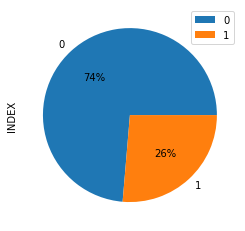

In [6]:
train_frame.groupby([target_variable]).sum().plot(
    kind='pie', y='INDEX', autopct='%1.0f%%');

In [7]:
train_frame.drop(columns=['INDEX'], inplace=True) # Drop INDEX as it is irrelevant

<h4 class="alert alert-warning">
     As expected, the claim cases are a minority, with a ratio of nearly 1:3.
</h4>

<h4 class="alert alert-success">
     Metric selection
</h4>

<h4 class="alert alert-warning">
     Given that we are facing a binary classification problem, we have to choose an appropriate metric. This can be : F1-score, precission or recall. Since we want to minimise insurance claims or conversely detect every claim, one could be tempted to choose Precision but that would push a model to always predict a claim. If one chooses Recall then the model would be pushed to mostly predicting that no claim would happen to maximise the metric. A reasonable metric would be the F1 score as it offers a blance between the two.
</h4>

<h2 class="alert alert-success">
     Exploratory data analysis
</h2>

In [8]:
# Fancy printing for getting statistics on unique values, missing ones and their type
for col in train_frame.columns:
        print(f'Column Name "{col}"'.ljust(25)+':', end=' ')
        print(f'Number of unique values: {train_frame[col].nunique(dropna=False)}'.ljust(30), end=' ')
        print(f'Number of missing values: {train_frame[col].isna().sum()}'.ljust(30), end = ' ')
        print(f'Column  type: {train_frame[col].dtype}')

Column Name "TARGET_FLAG": Number of unique values: 2     Number of missing values: 0    Column  type: int64
Column Name "KIDSDRIV"   : Number of unique values: 5     Number of missing values: 0    Column  type: int64
Column Name "AGE"        : Number of unique values: 61    Number of missing values: 6    Column  type: float64
Column Name "HOMEKIDS"   : Number of unique values: 6     Number of missing values: 0    Column  type: int64
Column Name "YOJ"        : Number of unique values: 22    Number of missing values: 454  Column  type: float64
Column Name "INCOME"     : Number of unique values: 6613  Number of missing values: 445  Column  type: object
Column Name "PARENT1"    : Number of unique values: 2     Number of missing values: 0    Column  type: object
Column Name "HOME_VAL"   : Number of unique values: 5107  Number of missing values: 464  Column  type: object
Column Name "MSTATUS"    : Number of unique values: 2     Number of missing values: 0    Column  type: object
Column Name

<h4 class="alert alert-warning">
     We can see that all columns can be informative, with only 6 columns containing missing values. Some columns present the wrong type of data such as : INCOME, HOME_VAL, BLUEBOOK and OLDCLAIM. Let's first divide our columns into categorical and numerical features so we can process them with ease later on.
</h4>

<h4 class="alert alert-warning">
     Evidently, any feature that has only a set of potential countable values should be condidered as categorical.To this end, any "yes, no" feature would be considered as categorical (PARENT1, MSATATUS, SEX, CAR_USE, RED_CAR, REVOKED, URBANCICITY). Some other features that fit this criteria are the following: EDUCATION, CLM_FREQ, CAR_TYPE, JOB, MVR_PTS, KIDSDRIV and HOMEKIDS
</h4>

In [9]:
# A list of categorical features
cat_features = ["PARENT1", "MSTATUS", "SEX", "CAR_USE", "RED_CAR", "REVOKED", "URBANICITY", "EDUCATION", "CLM_FREQ",
                "CAR_TYPE", "JOB", "MVR_PTS", "KIDSDRIV", "HOMEKIDS"] 

# A numerical column is any coluln that is not categorical and not the target.
num_features = [col for col in train_frame.columns if col not in cat_features and col!=target_variable] 

<h4 class="alert alert-success">
    Let's get some insights on features (Categorical)
</h4>

                               Visualising Categorical Features:                                


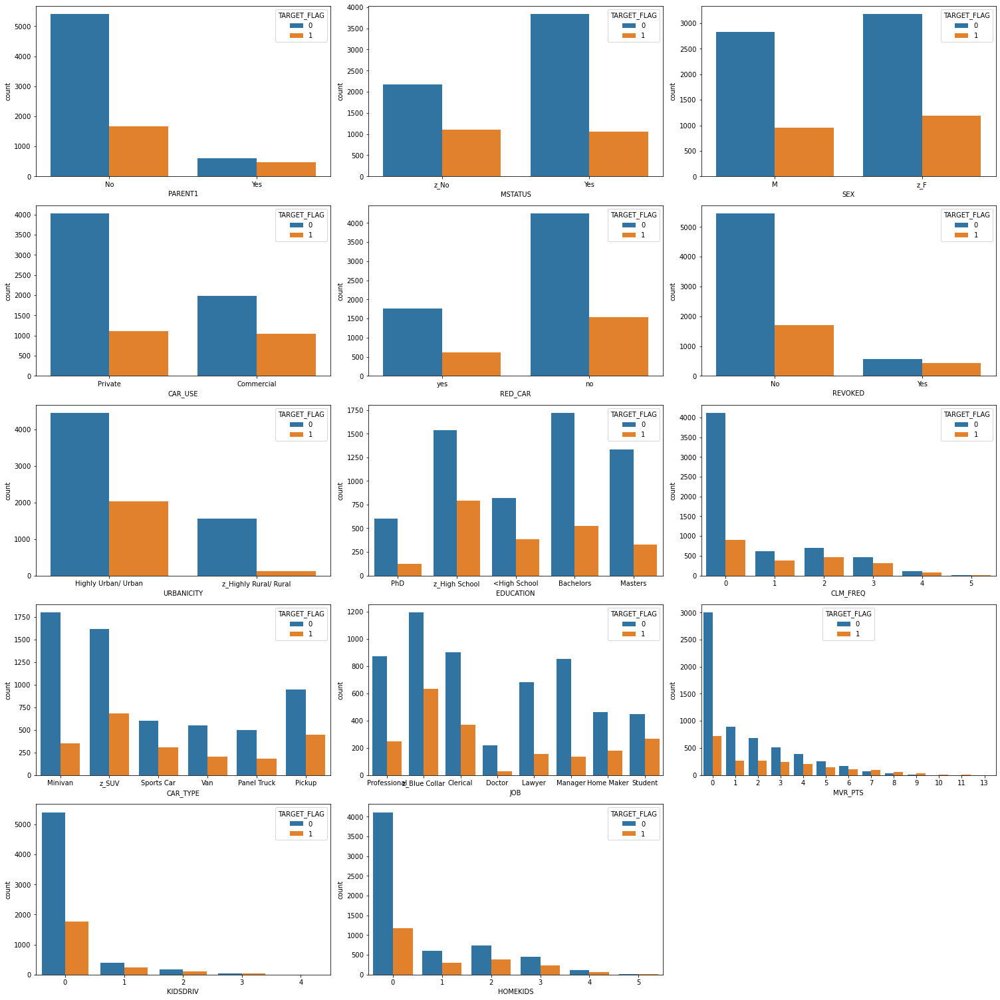

In [10]:
# categorical variables
print('\033[1mVisualising Categorical Features:'.center(100))
per_row = 3 # 3 plots per row

plt.figure(figsize=[21,21]) # Total figure size

for idx, col in enumerate(cat_features):
    plt.subplot(math.ceil(len(cat_features)/per_row) ,per_row, idx+1)
    sns.countplot(data=train_frame, x=col, hue=target_variable)
plt.tight_layout()
plt.show()


<h4 class="alert alert-warning">
From the visualisation above, we can notice the following :
<ul>
    
- Most instances don't have a revoked licence in the past 7 years which is in accordance with the MVR_PTS being 0 for the majority of them. 
    
- Most instances are married which can also be seen in the PARENT1 variable. The ratio of claims when someone is a single parent or not married is higher than when being married but that may be due to the imbalanced nature of the data. 
    
- Driving a sports car will increase the chances of claims which is logical due to driving a desirable/powerful vehicle.
    
- Driving in Highly urban cities will inevitably lead to more claims due to the nature of cities in general.
    
- Having teenagers that drive will increase claim chances too, as teenagers often have been characterised by reckless driving.
    
- Education level appears to have an inverse influence on the claims number.
    </ul>
 </h4>

<h4 class="alert alert-success">
    Let's get some insights on features (Numerical)
</h4>

In [11]:
# Lets define a function that removes the currency sign and converts an amount to float64
def amount_to_float(string_amount):
    return float(string_amount.replace('$', '').replace(',', '')) if isinstance(string_amount, str) else float(string_amount)

In [13]:
# Define a temporary dataframe just for illustration purposes
# Dataframe will only contain transformed numerical variables
numerical_df = train_frame[num_features]
for col in numerical_df.columns:
    if isinstance(numerical_df[col], object):
        numerical_df.loc[:, col] = numerical_df.loc[:, col].map(lambda x: amount_to_float(x))

                                 Visualising Numerical Features                                 


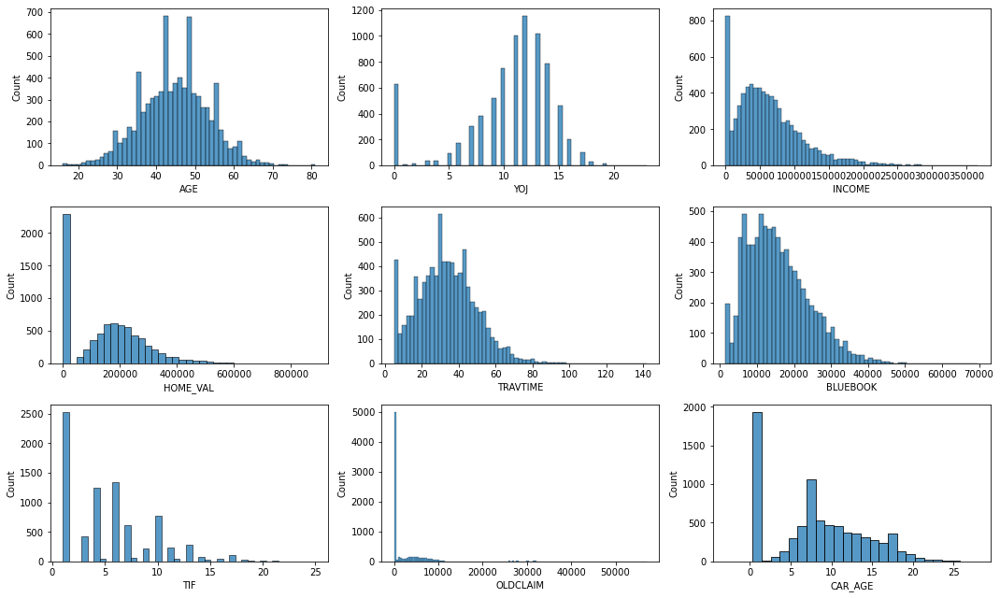

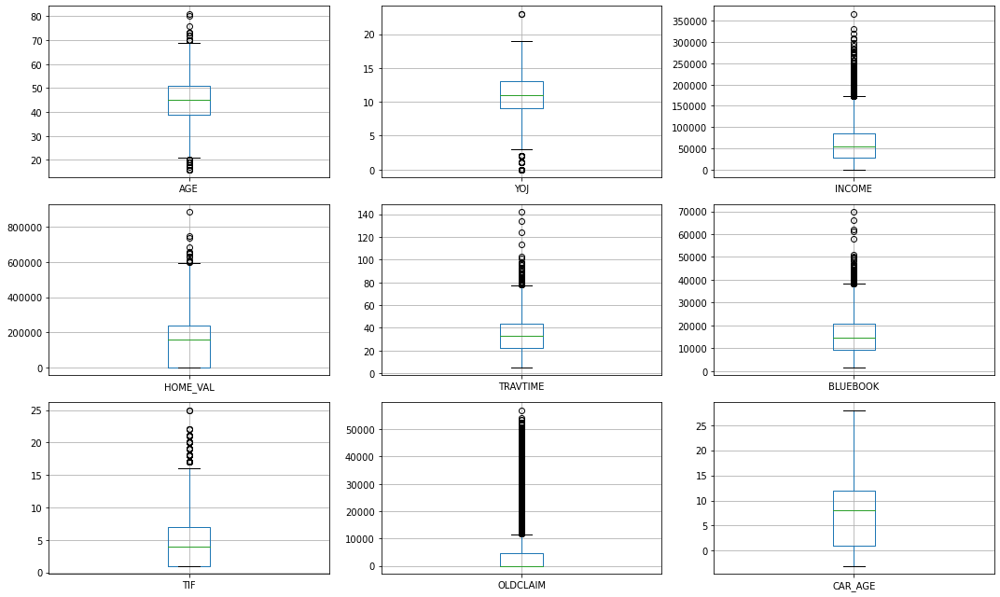

In [14]:
# Visualising the results as before
print('\033[1mVisualising Numerical Features'.center(100))
per_row = 3 # number of figures per row

# Plotting the histogram
plt.figure(figsize=[15,3*math.ceil(len(num_features)/per_row)])
for idx, col in enumerate(num_features):
    plt.subplot(math.ceil(len(num_features)/per_row) ,per_row, idx+1)
    sns.histplot(numerical_df[col])
plt.tight_layout()
plt.show()

# Plotting the boxplots
plt.figure(figsize=[15,3*math.ceil(len(num_features)/per_row)])
for idx, col in enumerate(num_features):
    plt.subplot(math.ceil(len(num_features)/per_row), per_row ,idx+1)
    numerical_df.boxplot([col])
plt.tight_layout()
plt.show()

<h4 class="alert alert-warning">
We can see that most of the distributions are highly skewed which should inform us on how to impute missing values. We also have to deal with outliers.
 </h4>

<h4 class="alert alert-success">
     Can we see some relationship betwen variables and/or with the target ?
</h4>

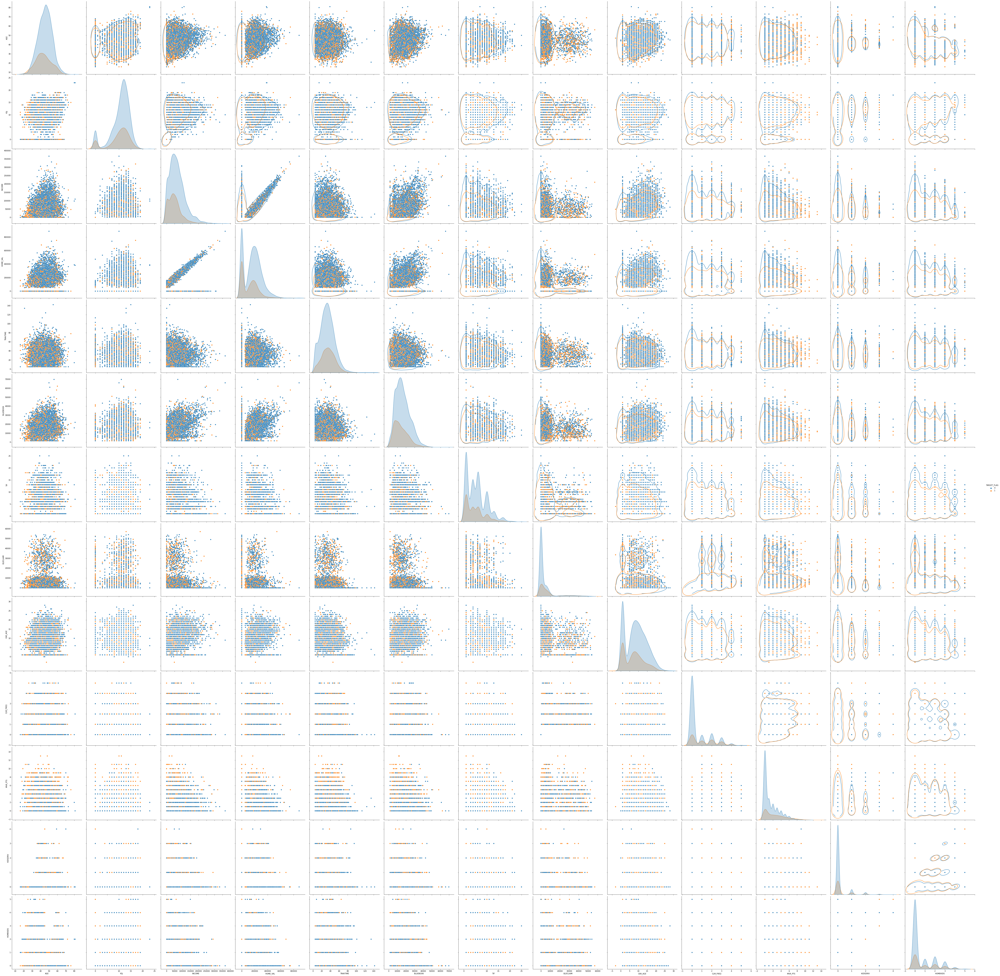

In [15]:
# Creating a pairplot with seaborn
g=sns.pairplot(pd.merge(numerical_df, train_frame[cat_features+[target_variable]], left_index=True, right_index=True ),
               hue=target_variable, height=6)
g.map_upper(sns.kdeplot, levels=1, color=".2")
plt.show()

<h4 class="alert alert-warning">
The pairplot above doesn't really inform us on any pairwise relationship except for the income and home valuation as these two are almost in a linear realtionship (the more you earn, the more your house will be expensive)
</h4>

<h4 class="alert alert-danger">
Note: You should double tap in order to zoom on the pairplot
</h4>

<h2 class="alert alert-success">
     Dealing with outliers, missing values and encoding
</h2>

<h4 class="alert alert-warning">
After the preliminary work that we have conducted, we can now start preparing the data to be used in our predictive algorithms. We shall begin by addressing outliers and then amputing missing values. 
</h4>

<h4 class="alert alert-warning">
Since the outliers are in the population of interest, at least from my perspective, we argue that we should keep them as removing them can exclude a certain population (for example old people or ones with expensive cars)
</h4>

In [15]:
# Transform string to float64 in numerical columns on the train dataset
for col in train_frame:
    if col in num_features and isinstance(train_frame[col], object):
        train_frame.loc[:, col] =  train_frame.loc[:, col].apply(lambda x: amount_to_float(x))

<h4 class="alert alert-warning">
Let's now deal with missing values which at most account for 6% in a certain attribute. We can drop these values but because we risk to also drop the minority class we shall resort to imputation. For imputation, we shall use skearn's simpleimputer for the sake of simplicity (One can also use KNNimputer but it requires some settings up). For numerical variables, as they are skewed, we should impute using the median rather than the mean. When it comes to categorical features, missing values will be replaced by the most frequent one.
</h4>

<h4 class="alert alert-warning">
For encoding categorical features, we shall use the Count/ordinal encoder for two reasons : It is suitable  with linear and non linear algorithms (avoids collisions for encoding, not sensitive to outliers) and avoids creating a high dimensional data frame (when using one hot encoding for example)
</h4>

In [16]:
class CountOrdinalEncoder(OrdinalEncoder):
    """Encode categorical features as an integer array
    usint count information.
    """
    def __init__(self, categories='auto', dtype=np.float64):
        self.categories = categories
        self.dtype = dtype

    def fit(self, X, y=None):
        """Fit the OrdinalEncoder to X.

        Parameters
        ----------
        X : array-like, shape [n_samples, n_features]
            The data to determine the categories of each feature.

        Returns
        -------
        self
        """
        self.handle_unknown = 'use_encoded_value'
        self.unknown_value = -1
        super().fit(X)
        X_list, _, _ = self._check_X(X)
        # now we'll reorder by counts
        for k, cat in enumerate(self.categories_):
            counts = []
            for c in cat:
                counts.append(np.sum(X_list[k] == c))
            order = np.argsort(counts)
            self.categories_[k] = cat[order]
        return self

In [17]:
# The pipeline for categorical features
cat_pipeline = make_pipeline(
    SimpleImputer(strategy='most_frequent'),
    CountOrdinalEncoder(),
)

<h4 class="alert alert-warning">
For numerical features, we should impute using the median as we have said earlier. We shall also use a standard scaler because some algorithms are affected by the scale of some features. 
</h4>

In [18]:
# The numerical features pipeline
num_pipeline = make_pipeline(
    SimpleImputer(strategy='median'),
    StandardScaler(),
)

<h4 class="alert alert-success">
Putting it all together
    </h4>

In [19]:
# Creating a preprocessing column transformer
preprocessing = make_column_transformer(
    (cat_pipeline, cat_features),
    (num_pipeline, num_features)
)

<h2 class="alert alert-success">
Feature selection and imbalanced data
</h2>



<h4 class="alert alert-warning">
For feature selection, we shall use correlation. We could have alos used random forest permutation importance criterion but since we don't have an held-out test dataset (with noticeable size) with the target provided, using this criterion would give more importance to the features with the highest criterion. As for data imbalance, We have 3 global approches that we can use:
<ul>
    
- Undersampling, this can be used during training or before hand. 
    
- Oversampling using random oversampling, SMOTE or someothe technique but that means that we would add 4000 samples which accounts for 50% of the data. Adding redundant or artificial features by this ratio isn't optimal.
    
- Using algorithms that already incorporate imbalanced learning like random forests or some bagging features. 
    
</ul>
    
We will use random undersampling during training or before training, We will be left with approximately 50% of the dataset which isn't very bad.
</h4>

In [20]:
# Splitting the target and features
train_frame, train_target = train_frame.drop(columns=[target_variable]), train_frame[target_variable]
# Create a temporary dataframe with using the column transformer created earlier
train_frame_trans = preprocessing.fit_transform(train_frame)
# Convert it to a dataframe
train_frame_trans = pd.DataFrame(train_frame_trans, index=train_frame.index, columns=train_frame.columns)
# Merge it with the target to create the heatmap
train_frame_trans = pd.merge(train_frame_trans, train_target, right_index=True, left_index=True)

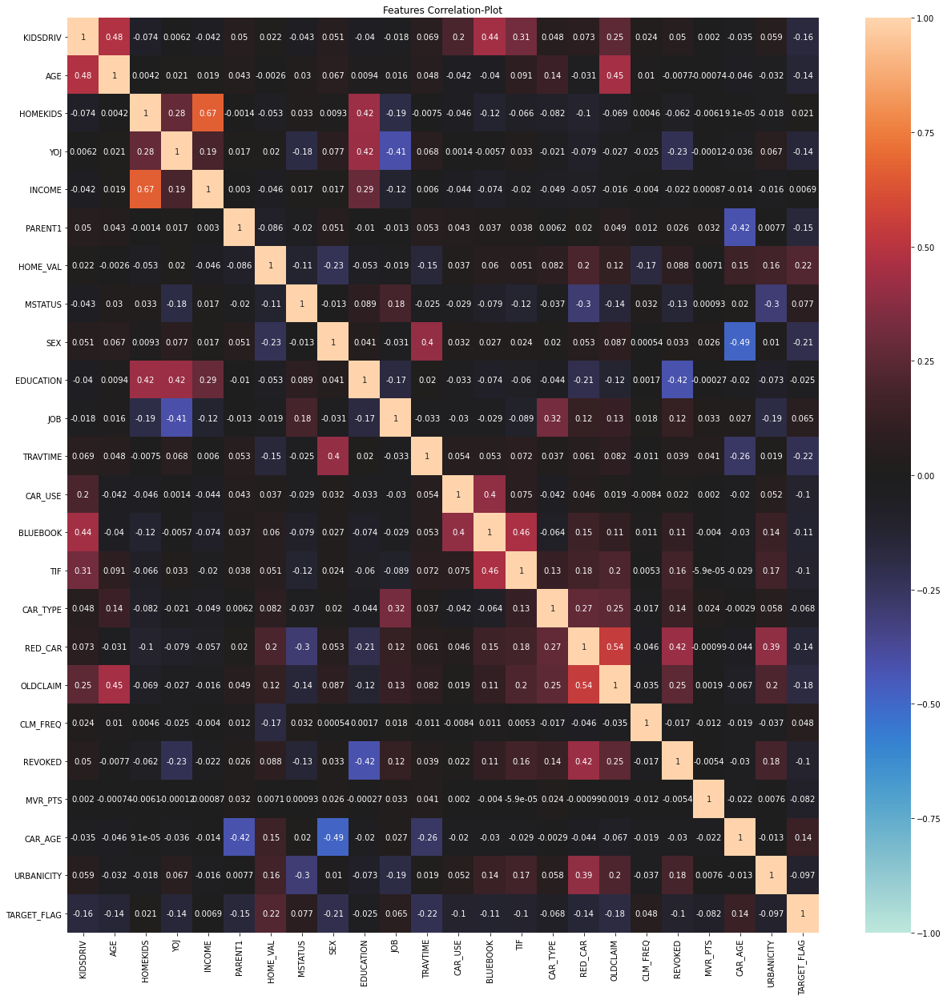

In [21]:
plt.figure(figsize=[21,21])
plt.title('Features Correlation-Plot')
sns.heatmap(train_frame_trans[train_frame_trans.columns].corr(), vmin=-1, vmax=1, center=0, annot=True) #, 
plt.show()

<h4 class="alert alert-warning">
We should evaluate the plot above with some care as some of the correlations for some multi-categorical columns can be tricky. We can see that AGE is strongly correlated with OLDCLAIM while being inversely correlated to being married. We can also observe that HOMEKIDS is strongly correlated with the INCOME (More income means that one can afford to have more kids). We can also observe that being not a red car is correlated with OLDCLAIM but that maybe due to the nature of the how the variable was created.
</h4>

<h4 class="alert alert-warning">
We shall drop the HOMEKIDS variable and keep the INCOME instead. This would result in reworking the preprocessing pipelines
</h4>

In [22]:
cat_features.remove('HOMEKIDS')

In [23]:
# Re-running the preprocessing transformer
preprocessing = make_column_transformer(
    (cat_pipeline, cat_features),
    (num_pipeline, num_features)
)

In [24]:
# Dropping the column in the train dataframe
train_frame.drop(columns=['HOMEKIDS'], inplace=True)

<h2 class="alert alert-success">
 Model building and selection 
</h2>

<h4 class="alert alert-warning">

Given that the problem is a classification problem, we shall try 3 algorithms : Support Vector Machine (SVM), Random Forest classifier and Logistic Regression. We shall use repeated stratified K-fold cross validation (k=5, repeat=3) with hyper parameter optimisation to choose the best model for the problem at hand.
</h4>

In [25]:
# We have already devided the features and target variables
# We have already built the preporcessing pipeline
# We now create the models

# Random Forest
rf_model = make_pipeline_imblearn(
    preprocessing,
    RandomUnderSampler(),
    RandomForestClassifier()
)

# logistic regression
lr_model = make_pipeline_imblearn(
    preprocessing,
    RandomUnderSampler(),
    LogisticRegression()
)

# SVM classifier

svm_model = make_pipeline_imblearn(
    preprocessing,
    RandomUnderSampler(),
    SVC()
)

<h4 class="alert alert-success">
Let's create the search space for our grid search for each algorithm
</h4>

In [26]:
# Logistic regression
lr_search = {'logisticregression__solver' : ['newton-cg', 'lbfgs', 'liblinear'],
             'logisticregression__penalty' : ['l2'],
             'logisticregression__C': loguniform(1e-5, 100)}

# Random forest
rf_search = {'randomforestclassifier__bootstrap': [True, False],
            'randomforestclassifier__max_depth': [10, 20, 50, 100, None],
            'randomforestclassifier__max_features': ['auto', 'sqrt'],
            'randomforestclassifier__min_samples_leaf': [5, 10, 20, 30],
            'randomforestclassifier__min_samples_split': [2, 5, 10],
            'randomforestclassifier__n_estimators': [50, 100]}

# SVM
svm_search = {"svc__C": [.01, .1, 1, 5, 10, 100],             
             "svc__gamma": [.01, .1, 1, 5, 10, 100],
             "svc__kernel": ["rbf"],
             "svc__random_state": [1]}

<h4 class="alert alert-success">
Repeated stratified cross validation
</h4>

In [27]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)

<h3 class="alert alert-success">
Testing the logistic regression model
</h3>

In [28]:
lr_cv = RandomizedSearchCV(lr_model, lr_search, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=5, random_state=1, verbose=2)

In [29]:
lr = lr_cv.fit(train_frame, train_target).best_estimator_

Fitting 5 folds for each of 50 candidates, totalling 250 fits


<h5 class="alert alert-success">
Getting some stats on the training dataset
</h5>

In [30]:
print(classification_report(train_target, lr.predict(train_frame)))

              precision    recall  f1-score   support

           0       0.88      0.71      0.79      6008
           1       0.48      0.74      0.58      2153

    accuracy                           0.72      8161
   macro avg       0.68      0.72      0.68      8161
weighted avg       0.78      0.72      0.73      8161



In [31]:
print(confusion_matrix(train_target, lr.predict(train_frame)))

[[4250 1758]
 [ 560 1593]]


<h3 class="alert alert-success">
Testing the Random forest model
</h3>

In [32]:
rf_cv = RandomizedSearchCV(rf_model, rf_search, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=5, random_state=1, verbose=2)

In [33]:
rf = rf_cv.fit(train_frame, train_target).best_estimator_

Fitting 5 folds for each of 50 candidates, totalling 250 fits


<h5 class="alert alert-success">
Getting some stats on the training dataset
</h5>

In [34]:
print(classification_report(train_target, rf.predict(train_frame)))

              precision    recall  f1-score   support

           0       0.98      0.79      0.88      6008
           1       0.62      0.96      0.75      2153

    accuracy                           0.84      8161
   macro avg       0.80      0.88      0.82      8161
weighted avg       0.89      0.84      0.84      8161



In [35]:
print(confusion_matrix(train_target, rf.predict(train_frame)))

[[4753 1255]
 [  87 2066]]


<h3 class="alert alert-success">
Testing the SVM model 
</h3>

In [36]:
svm_cv = RandomizedSearchCV(svm_model, svm_search, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=5, random_state=1, verbose=2)

In [37]:
svm = svm_cv.fit(train_frame, train_target).best_estimator_

Fitting 5 folds for each of 36 candidates, totalling 180 fits


C:\Users\moham\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:285: UserWarning: The total space of parameters 36 is smaller than n_iter=50. Running 36 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


<h5 class="alert alert-success">
Getting some stats on the training dataset
</h5>

In [38]:
print(classification_report(train_target, svm.predict(train_frame)))

              precision    recall  f1-score   support

           0       0.91      0.72      0.80      6008
           1       0.50      0.80      0.62      2153

    accuracy                           0.74      8161
   macro avg       0.70      0.76      0.71      8161
weighted avg       0.80      0.74      0.75      8161



In [40]:
print(confusion_matrix(train_target, svm.predict(train_frame)))

[[4308 1700]
 [ 441 1712]]


<div class="alert alert-warning">
Given the criterion we set in the metric selection section, and the stats above, we cn see that the random forest classifier is the most promissing model among the bunch. We should subsequently employ it to predict on the test set.
</div>

<h2 class="alert alert-success">
Predicting on the test set 
</h2>

In [41]:
# Removing irrelevant columns
test_frame.drop(columns=['INDEX', 'TARGET_AMT', 'HOMEKIDS', 'TARGET_FLAG'], inplace=True)

In [42]:
# Transform string to float64 in numerical columns on the test dataset
for col in test_frame:
    if col in num_features and isinstance(test_frame[col], object):
        test_frame.loc[:, col] =  test_frame.loc[:, col].apply(lambda x: amount_to_float(x))

<h5 class="alert alert-success">
Predicting using the chosen algorithm
</h5>

In [43]:
# Predicting
pred = lr.predict(test_frame)

In [45]:
# Array to dataframe
predicted = pd.DataFrame(pred, columns = ['PRED_TARGET_FLAG'])

In [47]:
# Dataframe to csv, removing index too
predicted.to_csv('./predictions_results.csv', index=False)